In [1]:
%matplotlib inline
import sys
sys.path.append('libraries')
from pathlib import Path
import numpy as np, scipy, matplotlib.pyplot as plt, sklearn, urllib, IPython.display as ipd
import librosa, librosa.display
import tfm_lib
import stanford_mir; stanford_mir.init()

**Carga de señal y audio**

In [2]:
x, sr = librosa.load('../audios/ballenas.wav', duration=2*60)

In [3]:
ipd.Audio(x, rate=sr)

**Visualización**

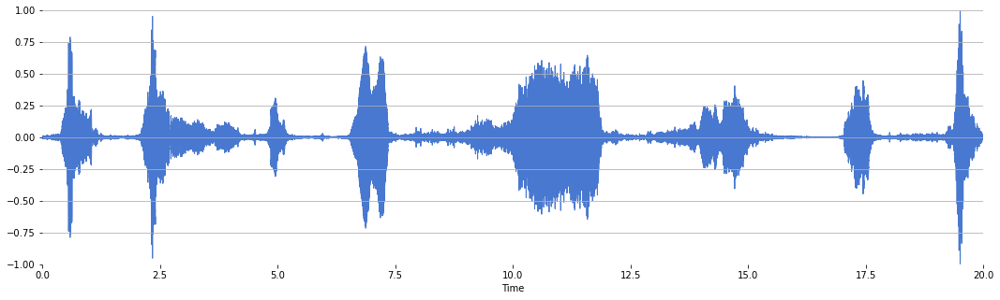

In [4]:
plt.rcParams['figure.figsize'] = (18, 5)
librosa.display.waveplot(x/x.max(), sr=sr)
plt.xlim(0, 20)
plt.xscale('linear')
plt.grid(axis='x')

**Selección tamaño ventana**

In [5]:
t =30*(10**-3)
frame_length = 2**(int(np.log2(t*sr)))
hop_length = int(frame_length/2)
frame_length, hop_length

(512, 256)

In [6]:
s1 = x[int(0*sr):int(20*sr)]
rmse1 = librosa.feature.rms(s1, hop_length=hop_length, frame_length=frame_length, center=True)[0]
zero1 = librosa.feature.zero_crossing_rate(s1, frame_length=frame_length, hop_length=hop_length, center=True)[0]
flat1 = librosa.feature.spectral_flatness(s1, hop_length=hop_length)[0]
frames1 = range(len(rmse1))
t1 = librosa.frames_to_time(frames1, sr=sr, hop_length=hop_length)

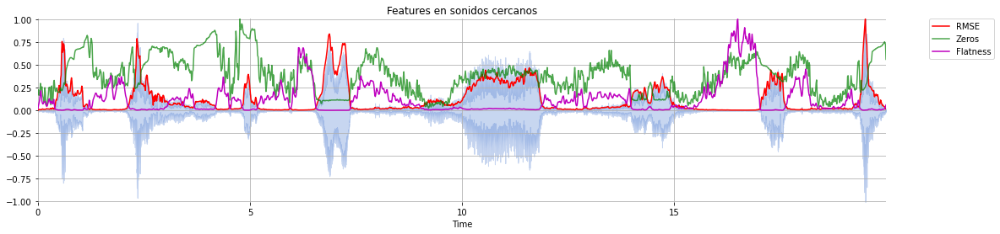

In [7]:
plt.rcParams['figure.figsize'] = (18, 4)

librosa.display.waveplot(s1/s1.max(), sr=sr, alpha = 0.3)
plt.plot(t1, rmse1/rmse1.max(), color='r')
plt.plot(t1, zero1/zero1.max(), color='g', alpha= 0.7)
plt.plot(t1, flat1/flat1.max(), color='m')
#plt.ylim(-0.2, 1)
plt.title('Features en sonidos cercanos')
plt.legend(('RMSE', 'Zeros', 'Flatness'), bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.show()

In [8]:
s1 = x[int(2*sr):int(6*sr)]
s2 = x[int(8.5*sr):int(12*sr)]
rmse1 = librosa.feature.rms(s1, hop_length=hop_length, frame_length=frame_length, center=True)[0]
rmse2 = librosa.feature.rms(s2, hop_length=hop_length, frame_length=frame_length, center=True)[0]
zero1 = librosa.feature.zero_crossing_rate(s1, frame_length=frame_length, hop_length=hop_length, center=True)[0]
zero2 = librosa.feature.zero_crossing_rate(s2, frame_length=frame_length, hop_length=hop_length, center=True)[0]
flat1 = librosa.feature.spectral_flatness(s1, hop_length=hop_length)[0]
flat2 = librosa.feature.spectral_flatness(s2, hop_length=hop_length)[0]
frames1 = range(len(rmse1))
frames2 = range(len(rmse2))
t1 = librosa.frames_to_time(frames1, sr=sr, hop_length=hop_length)
t2 = librosa.frames_to_time(frames2, sr=sr, hop_length=hop_length)

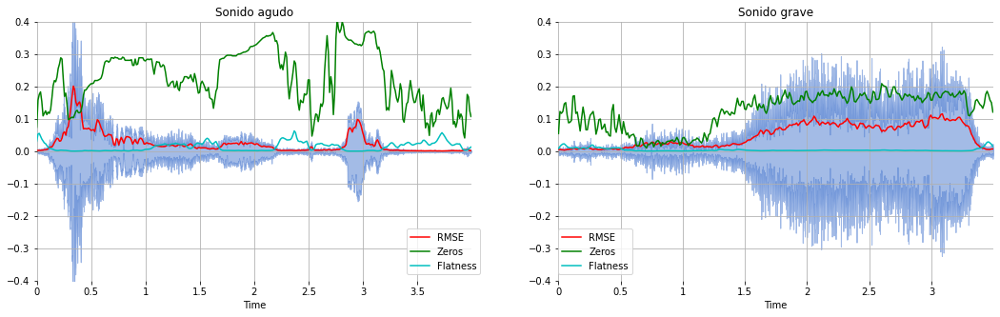

In [9]:
plt.rcParams['figure.figsize'] = (18, 5)

plt.subplot(1, 2, 1)
librosa.display.waveplot(s1, sr=sr, alpha = 0.5)
plt.plot(t1, rmse1, color='r')
plt.plot(t1, zero1, color='g')
plt.plot(t1, flat1, color='c')
plt.ylim(-0.4, 0.4)
plt.legend(('RMSE', 'Zeros', 'Flatness'), bbox_to_anchor=(0.85, 0.2), loc=2, borderaxespad=0.)
plt.title('Sonido agudo')

plt.subplot(1, 2, 2)
librosa.display.waveplot(s2, sr=sr, alpha = 0.5)
plt.plot(t2, rmse2, color='r')
plt.plot(t2, zero2, color='g')
plt.plot(t2, flat2, color='c')
plt.ylim(-0.4, 0.4)
plt.legend(('RMSE', 'Zeros', 'Flatness'), bbox_to_anchor=(0., 0.2), loc=2, borderaxespad=0.)
plt.title('Sonido grave')

plt.show()

**Extraer características**

In [10]:
rmse, centroide, zeros, bandwidth, flatness, rolloff = tfm_lib.extract_features(x, sr, hop_length, frame_length)
frames = range(len(rmse))
t = librosa.frames_to_time(frames, sr=sr, hop_length=hop_length)

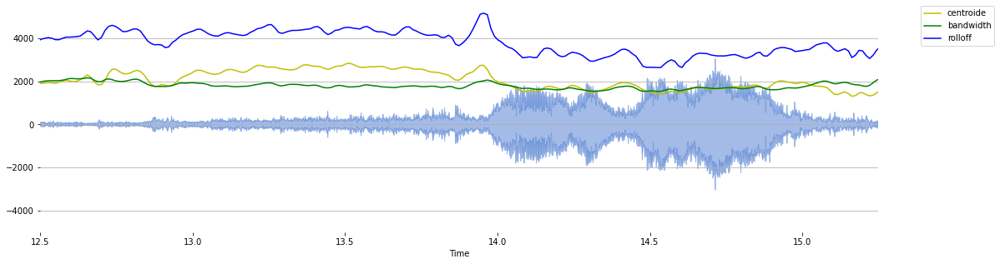

In [12]:
plt.rcParams['figure.figsize'] = (18, 5)
librosa.display.waveplot(x*15000, sr=sr, alpha = 0.5)
#plt.plot(t, rmse/rmse.max(), color='r')
plt.plot(t, centroide, color='y')
#plt.plot(t, zeros/zeros.max(), color='c')
plt.plot(t, bandwidth, color='g')
#plt.plot(t, flatness, color='m')
plt.plot(t, rolloff, color='b')
plt.xlim(12.5,15.25)
plt.ylim(-5000, 5500)
plt.xscale('linear')
plt.grid(axis='x')
plt.legend(('centroide', 'bandwidth', 'rolloff'), bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.show()

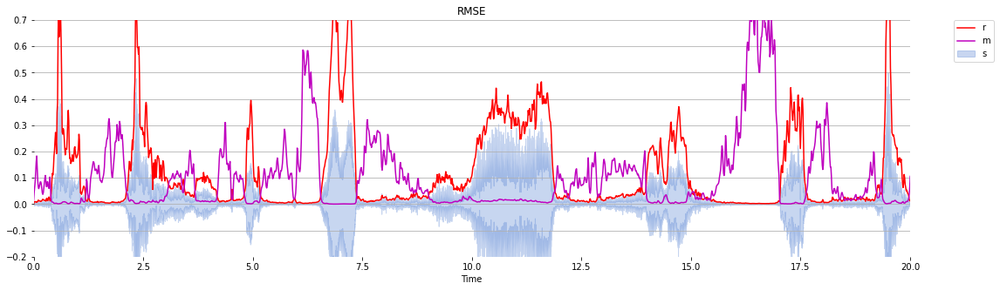

In [13]:
plt.rcParams['figure.figsize'] = (18, 5)
librosa.display.waveplot(x, sr=sr, alpha = 0.3)
plt.plot(t, rmse/rmse.max(), color='r')
#plt.plot(t, centroide, color='y')
#plt.plot(t, zeros/zeros.max(), color='c')
#plt.plot(t, bandwidth, color='g')
plt.plot(t, flatness/flatness.max(), color='m')
#plt.plot(t, rolloff, color='b')
plt.xlim(0,20)
plt.ylim(-0.2, 0.7)
plt.xscale('linear')
plt.grid(axis='x')
plt.legend(('rmse'), bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('RMSE')

plt.show()

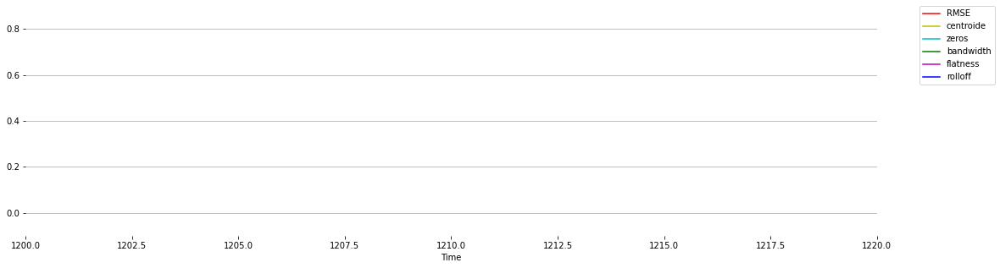

In [15]:
plt.rcParams['figure.figsize'] = (18, 5)
librosa.display.waveplot(, sr=sr, alpha = 0.3)
plt.plot(t, rmse/rmse.max(), color='r')
plt.plot(t, centroide/centroide.max(), color='y')
plt.plot(t, zeros/zeros.max(), color='c')
plt.plot(t, bandwidth/bandwidth.max(), color='g')
plt.plot(t, flatness/flatness.max(), color='m')
plt.plot(t, rolloff/rolloff.max(), color='b')
plt.xlim(1200,1220)
plt.ylim(-0.1, 0.9)
plt.xscale('linear')
plt.grid(axis='x')
plt.legend(('RMSE', 'centroide', 'zeros', 'bandwidth', 'flatness', 'rolloff'), bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.show()

In [13]:
ipd.Audio(x[1200*sr:1220*sr], rate=sr)

**Cortes**

In [6]:
rmse_lim = rmse/rmse.max()
flatness_lim = flatness/flatness.max()
limite_rmse1 = 0.02
limite_rmse = 0.01
limite_flat = 0.015

vector = np.array([])
for i, (r, f) in enumerate(zip(rmse_lim, flatness_lim)):
    if r > limite_rmse1:
        vector = np.append(vector, 1)
    else:
        if r < limite_rmse:
            if f > limite_flat:
                vector = np.append(vector, 0)
            else:
                vector = np.append(vector, 1)
        else:
            vector = np.append(vector, 1)

Text(0.5, 1.0, 'Marcas')

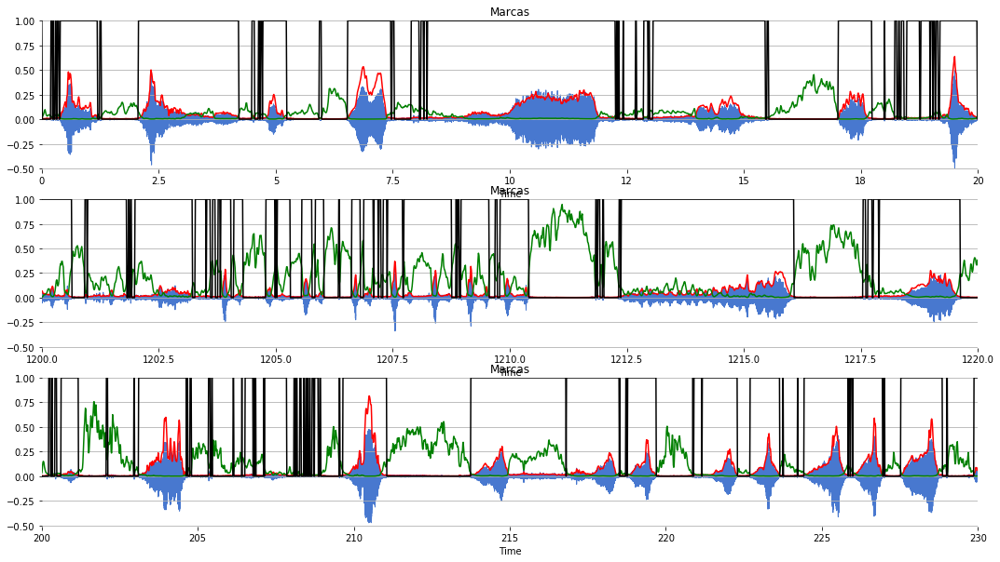

In [24]:
plt.rcParams['figure.figsize'] = (18, 10)

plt.subplot(3,1,1)
librosa.display.waveplot(x, sr=sr)
plt.plot(t, rmse_lim, color='r')
plt.plot(t, flatness_lim, color='g')
plt.plot(t, vector, color='k')
plt.xlim(0, 20)
#plt.ylim(0, 1)
plt.grid(axis='x')
#plt.legend(('RMSE'))
plt.title('Marcas')

plt.subplot(3,1,2)
librosa.display.waveplot(x, sr=sr)
plt.plot(t, rmse_lim, color='r')
plt.plot(t, flatness_lim, color='g')
plt.plot(t, vector, color='k')
plt.xlim(60*20, 60*20+20)
#plt.ylim(0, 1)
plt.grid(axis='x')
plt.xscale('linear')
#plt.legend(('RMSE'))
plt.title('Marcas')

plt.subplot(3,1,3)
librosa.display.waveplot(x, sr=sr)
plt.plot(t, rmse_lim, color='r')
plt.plot(t, flatness_lim, color='g')
plt.plot(t, vector, color='k')
plt.xlim(200, 230)
#plt.ylim(0, 1)
plt.grid(axis='x')
plt.xscale('linear')
#plt.legend(('RMSE'))
plt.title('Marcas')

In [17]:
ipd.Audio(x[int(0*sr):int(7.5*sr)], rate=sr)

**Selección de sonidos**

In [7]:
cortes = []
for v in vector:
    n = 0
    while n < hop_length:
        cortes.append(v)
        n +=1

In [8]:
ab = abs(len(cortes) - len(x))
ceros = np.zeros([ab])
y = x
if len(cortes) > len(y):
    y = np.append(y, ceros)
if len(cortes) < len(y):
    cortes = np.append(cortes, ceros)
cortes = np.array(cortes)

Text(0.5, 1.0, 'Cortes 512')

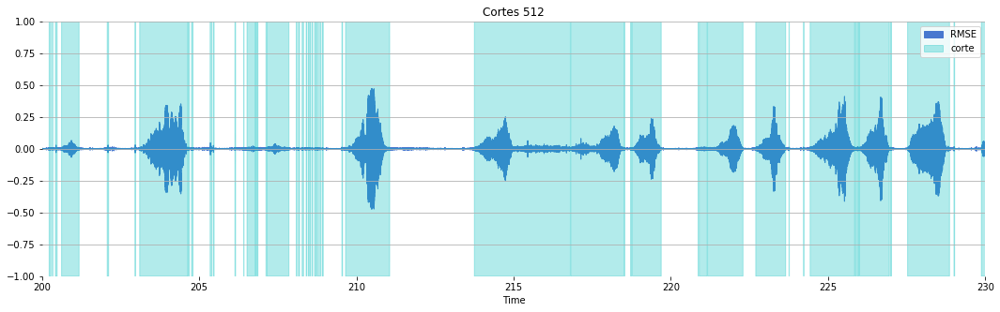

In [27]:
plt.rcParams['figure.figsize'] = (18, 5)

librosa.display.waveplot(y, sr=sr)
librosa.display.waveplot(cortes, sr=sr, color='c', alpha = 0.3)
plt.xlim(200,230)
#plt.ylim(-0.1, 0.2)
plt.grid(axis='x')
plt.xscale('linear')
plt.legend(('RMSE', 'corte'))
plt.title('Cortes 512')

In [32]:
ipd.Audio(y[220*sr:225*sr], rate=sr)

**Eliminación de ruido y fragmentación**

In [9]:
yn = cortes * y

Text(0.5, 1.0, 'Cortes 512')

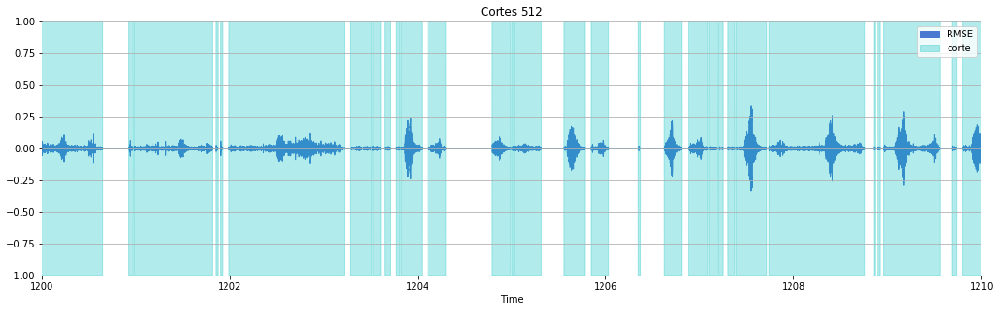

In [29]:
plt.rcParams['figure.figsize'] = (18, 5)

librosa.display.waveplot(yn, sr=sr)
librosa.display.waveplot(cortes, sr=sr, color='c', alpha = 0.3)
plt.xlim(20*60,20*60+10)
#plt.ylim(-0.1, 0.2)
plt.grid(axis='x')
plt.xscale('linear')
plt.legend(('RMSE', 'corte'))
plt.title('Cortes 512')

In [29]:
c = []
cortes_final = []
for n in yn:
    if n != 0:
        c.append(n)
    else:
        cortes_final.append(c)
        c = []

In [37]:
cortes_array = []
for n in cortes_final:
    if len(n) > sr/2 and len(n) < 4*sr:
        #m = tfm_lib.igualar(n, sr)
        cortes_array.append(np.array(n))

In [38]:
len(cortes_array)

383

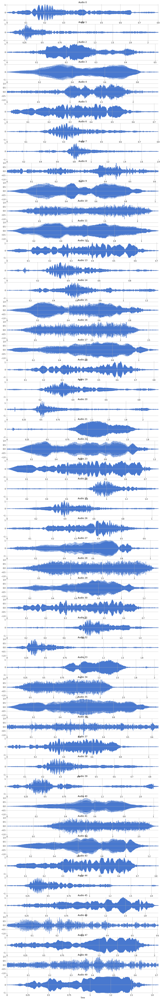

In [39]:
plt.figure(figsize=(15, 100))
for i, c in enumerate(cortes_array[:50]):
    plt.subplot(50, 1, i+1)
    librosa.display.waveplot(cortes_array[i]/cortes_array[i].max())
    plt.title('Audio {}'.format(i))

In [40]:
sonido = 46

In [41]:
ipd.Audio(cortes_array[sonido], rate=sr)

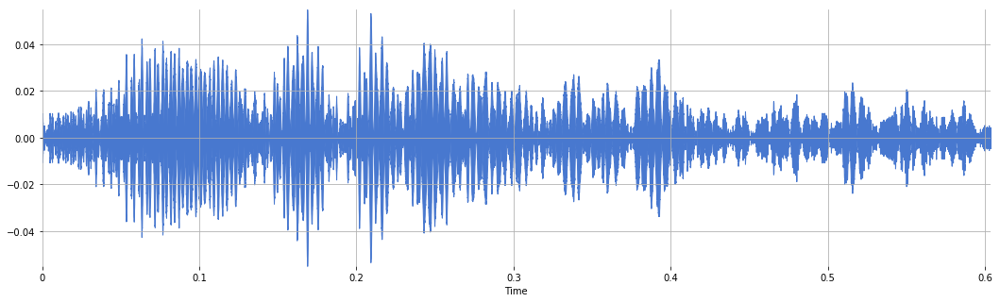

In [42]:
librosa.display.waveplot(cortes_array[sonido])

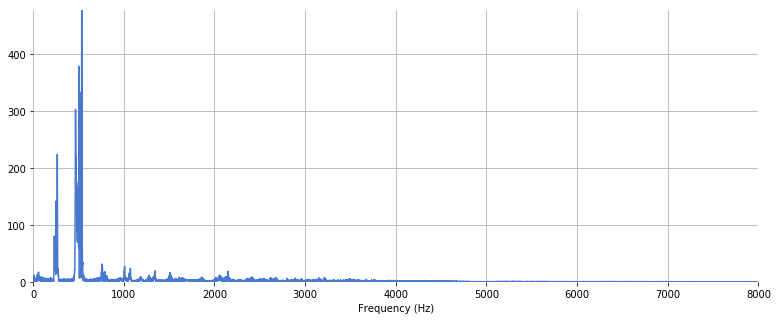

In [36]:
tfm_lib.fourier(cortes_array[sonido], xlima = 0, xlimb = 8000)

**Promedio RMSE**

In [46]:
def extract_features(signal, sr, hop_length, frame_length):
    import librosa
    return (librosa.feature.rmse(signal, hop_length=hop_length, frame_length=frame_length, center=True)[0]).mean()

In [47]:
medias = np.array([])
for m in cortes_array:
    medias = np.append(medias, (extract_features(m, sr, hop_length, frame_length)).mean())

In [48]:
len(medias)

383

In [49]:
import pandas as pd
df = pd.DataFrame({'signal': cortes_array, 'media': medias})
df.head(10)

,signal,media
0,"[-0.005820292979478836, -0.005678701680153608,...",0.057328
1,"[-0.004928584676235914, -0.004533345345407724,...",0.034798
2,"[0.0020874645560979843, 0.0023839115165174007,...",0.032443
3,"[-0.003167803166434169, -0.0024399075191468, -...",0.099285
4,"[-0.0028278487734496593, -0.002071761293336749...",0.025520
5,"[0.0017589975614100695, 0.002705513034015894, ...",0.054392
6,"[0.011515671387314796, 0.011281725019216537, 0...",0.056000
7,"[-0.004183857701718807, -0.005870383232831955,...",0.026984
8,"[-0.000635320961009711, 0.0038041698280721903,...",0.011202
9,"[0.006341755855828524, 0.005790889263153076, 0...",0.079209


In [50]:
df.shape

(383, 2)

In [17]:
for indice_fila, fila in df.iterrows():
    #print(indice_fila)
    print(fila[1])

0.05732784477769998
0.03479760929624126
0.0324434247683651
0.09928458300772058
0.0255201579931867
0.05439238814161176
0.05600036384627929
0.026983731788915853
0.01120228512532887
0.07920895122918689
0.0596385505230358
0.09424664906784593
0.05530484666481026
0.0509053768053558
0.0323552519075592
0.07549523720044958
0.08231334648879146
0.06775790794341713
0.04953787510665666
0.04119354745344693
0.026550777597921592
0.06412591071277368
0.092022033578588
0.07257638242067954
0.03730490616001161
0.04610640891695606
0.037859771850359956
0.0681455261268579
0.07527268159176484
0.055744389861756234
0.07188331351871215
0.042959477293168465
0.03342876690481884
0.04797835862207211
0.06799500116538458
0.09246647517463213
0.006907822918628817
0.060967917440121505
0.049871273135661476
0.037448082865666206
0.08275010123496898
0.07040034031831459
0.09028802861911749
0.07600933957873446
0.04636460251013101
0.06295588694621779
0.012902923787942205
0.07562143029086231
0.009655458787345717
0.143989408784354

In [113]:
for indice_fila, fila in df.iterrows():
    if fila[1] < 0.01:
        print(indice_fila)
        print(fila[1])

21
0.008510401563005617
38
0.006907822918628817
42
0.006710013711018679
51
0.009655458787345717
54
0.004987780522399365
57
0.008828030771285007
59
0.009988559428193638
62
0.005732625986745728
70
0.009745912934381805
72
0.007128734168773292
85
0.00795689848116968
87
0.007444519325609549
98
0.007148783918139788
100
0.009145322721957762
101
0.006453915588722462
103
0.008454671703634023
107
0.0091129279474546
108
0.005708777976175765
115
0.008603450152271592
117
0.006073156633907227
119
0.005850048058730472
122
0.007950741896259482
129
0.006936595001561183
130
0.006228046676763552
133
0.006747117829950208
138
0.008793181860049624
187
0.0027769698796098197
196
0.007918911245252288
204
0.008922828847121518
223
0.005762756335426993
233
0.007906244038219762
263
0.006154989489736176
292
0.00977529175881823
294
0.0097232570674142
303
0.007268690718991683
315
0.005290103272172155
324
0.007609286153279207
325
0.0054334907892604235
346
0.009064739959825423
364
0.00489838753951803
376
0.007095727807

In [116]:
'''for indice_fila, fila in df1.iterrows():
    if fila[1] < 0.01:
        df1.drop([indice_fila], inplace = True)'''

In [120]:
df.shape

(386, 2)

In [51]:
cortes_final = []
for indice_fila, fila in df.iterrows():
    if fila[1] > 0.025:
        cortes_final.append(fila[0])

In [52]:
len(cortes_final)

291

In [53]:
ipd.Audio(cortes_final[21], rate=sr)

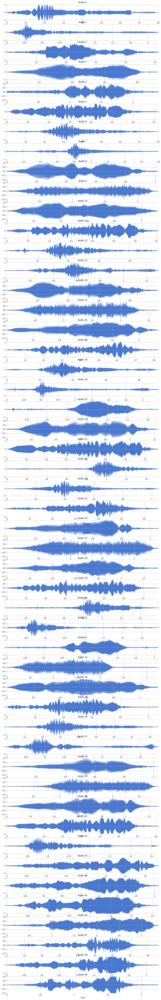

In [54]:
plt.figure(figsize=(15, 100))
for i, c in enumerate(cortes_final[:50]):
    plt.subplot(50, 1, i+1)
    librosa.display.waveplot(cortes_final[i]/cortes_final[i].max())
    plt.title('Audio {}'.format(i))

**Guardar cortes**

In [21]:
for i, c in enumerate(cortes_final):
    librosa.output.write_wav('cortes/corte1_'+str(i)+'.wav', c, sr)